In [1]:
import os
import sys
import cv2
import csv
import PIL
import h5py
import math
import glob
import openslide
import numpy as np
import skimage.filters as sk_filters
import matplotlib.pyplot as plt

from skimage import io, morphology, color
from PIL import Image, ImageDraw, ImageFont
from openslide.deepzoom import DeepZoomGenerator
from openslide import OpenSlideError, OpenSlideUnsupportedFormatError

In [2]:
BASE_DIR = os.path.join("../", "datasets/Camelyon17/")
MASK_DIR = os.path.join(BASE_DIR, "masks/")
LEVEL = 8 # 0=highest resolution

## Visualize WSI

In [3]:
def open_slide(filename):
    """
    Create Openslide Object from a WSI (.svs, .tif, .ndpi, etc).
    
    Args:
        filename (str): Name of the slide file to open.
    
    Returns:
        An OpenSlide object representing a whole-slide image.
    """
    try:
        slide = openslide.open_slide(filename)
    except OpenSlideUnsupportedFormatError:
        slide = None
        print("Unrecognized file format.")
    except OpenSlideError:
        slide = None
        print("Slide file recognized. OpenSlide error.")
    except FileNotFoundError:
        slide = None
        print("Slide file not found.")
    return slide


def get_slide_info(filename):
    """
    Display information about the magnification levels in the WSI:
        - Level count: Number of different image resolutions available within the WSI.
        - Level dimensions: Pixel dimensions of the entire grid at a particular resolution level.
    
    Args:
        filename (str): Name of the slide file.
    """
    
    slide = openslide.open_slide(filename)
    level_count = slide.level_count
    level_dimensions = slide.level_dimensions
    level_downsamples = slide.level_downsamples
#     print("Level count:         " + str(level_count))
#     print("Level dimensions:    " + str(level_dimensions))
    return level_count, level_dimensions, level_downsamples


def read_slide(slide, location, level, size, as_float=False):
    """
    Read a region of the WSI with Top Left corner at (x, y) at a certain resolution level
    
    Args:
        - slide     :    Openslide Object
        - location  :    (x, y) tuple giving the top left pixel in the level 0 reference frame
        - level     :    resolution level
        - size      :    (width, height) tuple giving the region size
    """
    img = slide.read_region(location, level, size)
    img = img.convert('RGB') # drop the alpha channel
    if as_float:
        img = np.asarray(img, dtype=np.float32)
    else:
        img = np.asarray(img)
    assert img.shape == (size[1], size[0], 3)
    return img


def display_slide(filename, level):
    """
    Display a scaled down version of a WSI.
    
    Args:
        - filename (str): name of the WSI to display.
        - level: resolution level
    """
    image_slide = open_slide(sample_slide)
    image = read_slide(image_slide, 
                       (0,0), 
                       level, 
                       (image_slide.level_dimensions[level][0], 
                        image_slide.level_dimensions[level][1]))

    plt.figure(figsize=(10, 10), dpi=100)
    plt.title("showing slide for: {}".format(os.path.splitext(os.path.basename(filename))[0]))
    plt.imshow(image)

Total number of WSIs:  10
sample_slide:  ../datasets/Camelyon17/training/center_4/patient_080_node_4.tif
Level count:  10
Level dimensions:  ((139776, 92160), (69888, 46080), (34944, 23040), (17472, 11520), (8736, 5760), (4368, 2880), (2184, 1440), (1092, 720), (546, 360), (273, 180))
Level downsamples:  (1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0)


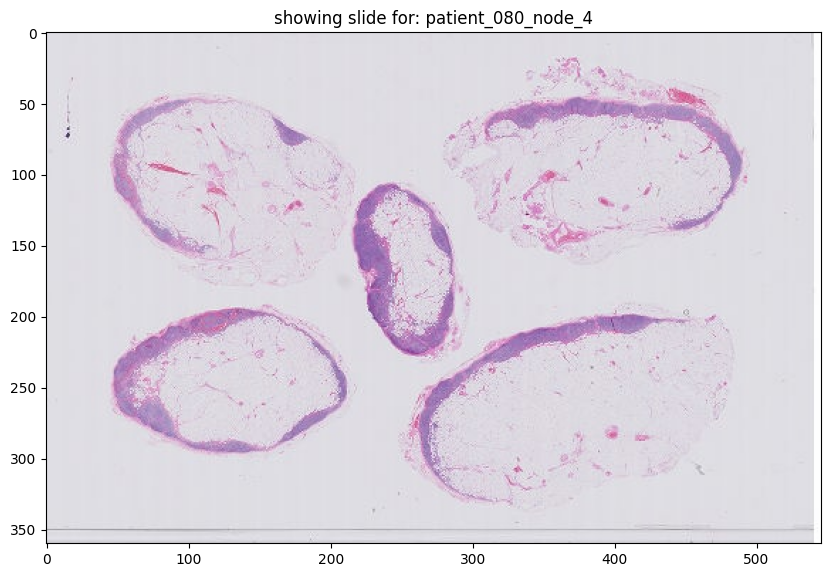

In [4]:
slides = glob.glob(BASE_DIR + 'training/center_*/patient_*.tif')
sample_slide = slides[7]
print("Total number of WSIs: ", len(slides))
print("sample_slide: ", sample_slide)
level_count, level_dimensions, level_downsamples = get_slide_info(sample_slide)
print("Level count: ", level_count)
print("Level dimensions: ", level_dimensions)
print("Level downsamples: ", level_downsamples)

display_slide(sample_slide, LEVEL)

## Tissue - Background Segmentation in WSI

In [5]:
def filter_otsu_threshold(np_img, output_type="uint8"):
    """
    Compute Otsu threshold on image as a NumPy array and return binary image based on 
    pixels above threshold.
    
    Args:
        np_img: Image as a NumPy array.
        output_type: Type of array to return (bool, float, or uint8).
    
    Returns:
        NumPy array (bool, float, or uint8) where True, 1.0, and 255 represent a pixel 
        above Otsu threshold.
    """
    otsu_thresh_value = sk_filters.threshold_otsu(np_img)
    otsu = (np_img > otsu_thresh_value)
    if output_type == "bool":
        pass
    elif output_type == "float":
        otsu = otsu.astype(float)
    else:
        otsu = otsu.astype("uint8") * 255
    return otsu


# def segment_tissue_from_background(slide, level):
#     """
#     Segment the Tissue foreground from the background through a series of transformation:
#     RGB --> Remove black background pixels--> HSV --> Median Blurring -->
#     Thresholding --> Morphological Operations to fill holes
    
#     NOTE: In some of the CAMELYON17 cases, the Otsu’s thresholding failed because of the
#     black regions in the WSI. So before the application of image thresholding operation,
#     the black pixel regions in the WSI background are replaced with white pixels.
    
#     Args:
#         slide: Path to the slide to segment.

#     Returns:
#         cleaned: a ndarray (n=2) containing a binary Tissue mask.
#     """
#     image_slide = open_slide(slide)
#     img = read_slide(image_slide, 
#                        (0,0), 
#                        level, 
#                        (image_slide.level_dimensions[level][0], 
#                         image_slide.level_dimensions[level][1])).copy()
#     #remove black background in some WSI
#     img[np.where((img==[0,0,0]).all(axis=2))] = [255,255,255]
    
#     img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
#     img_med = cv2.medianBlur(img_hsv[:, :, 1], 7)

#     otsu = filter_otsu_threshold(img_med)
#     arr = otsu>0
# #     cleaned = morphology.dilation(arr)
#     cleaned = morphology.remove_small_objects(arr, min_size=4)
#     cleaned = morphology.remove_small_holes(cleaned, area_threshold=16)
#     cleaned = morphology.opening(cleaned, morphology.disk(4))
#     return cleaned


# def overlay_img_and_segmentation_mask(img, mask):
#     """
#     Display the segmentation mask on top of the image.
    
#     Args:
#         - img: Image to be segmented.
#         - mask: Segmented mask of the Image.
#     """
#     # Construct RGB version of gray-level mask
#     mask_color = np.dstack((mask, mask, mask))

#     # Convert the input image and color mask to the HSV colorspace
#     img_hsv = color.rgb2hsv(img)
#     mask_hsv = color.rgb2hsv(mask_color)

#     # Replace the hue and saturation of the original image with that of the color mask
#     mask_hsv[..., 0] = img_hsv[..., 0]
#     mask_hsv[..., 1] = img_hsv[..., 1] * alpha

#     img_segmented = color.hsv2rgb(mask_hsv)

#     return img_segmented

In [6]:
def display_segmentation_pipeline(slide, level):
    """
    Display the intermediate stages of the preprocessing pi peline.
    
    Args:
        - slide: WSI to be segmented.
        - level: Resolution level of the WSI.
    """
    image_slide = open_slide(slide)
    img = read_slide(image_slide, 
                       (0,0), 
                       level, 
                       (image_slide.level_dimensions[level][0], 
                        image_slide.level_dimensions[level][1])).copy()
    img_clean = img.copy()
    img_clean[np.where((img==[0,0,0]).all(axis=2))] = [255,255,255] #remove back background
    
    img_hsv = cv2.cvtColor(img_clean, cv2.COLOR_RGB2HSV)
    img_med = cv2.medianBlur(img_hsv[:, :, 1], 7)

    otsu = filter_otsu_threshold(img_med)
    
    arr = otsu>0
    mask = morphology.remove_small_objects(arr, min_size=4)
    mask = morphology.remove_small_holes(mask, area_threshold=16)
    mask = morphology.opening(mask, morphology.disk(4))
    
    #overlay img and mask
    mask_color = np.dstack((mask, mask, mask))
    img_hsv = color.rgb2hsv(img_clean)
    mask_hsv = color.rgb2hsv(mask_color)
    # Replace the hue and saturation of the original image with that of the color mask
    mask_hsv[..., 0] = img_hsv[..., 0]
    mask_hsv[..., 1] = img_hsv[..., 1] * alpha
    img_masked = color.hsv2rgb(mask_hsv)
    
    #plot    
    fig, axs = plt.subplots(2, 3, figsize=(50, 50),)
    axs[0, 0].imshow(img)
    axs[0, 0].set_title('Input WSI')   
    axs[0, 1].imshow(img_clean)
    axs[0, 1].set_title('Removing Black Background') 
    axs[0, 2].imshow(img_hsv[:, :, 1])
    axs[0, 2].set_title('Saturation Component of HSV')
    axs[1, 0].imshow(img_med)
    axs[1, 0].set_title('Median Filtering')
    axs[1, 1].imshow(otsu)
    axs[1, 1].set_title('Otsu Thresholding') 
    axs[1, 2].imshow(mask)
    axs[1, 2].set_title('Post Morphological Operation')
    plt.show()

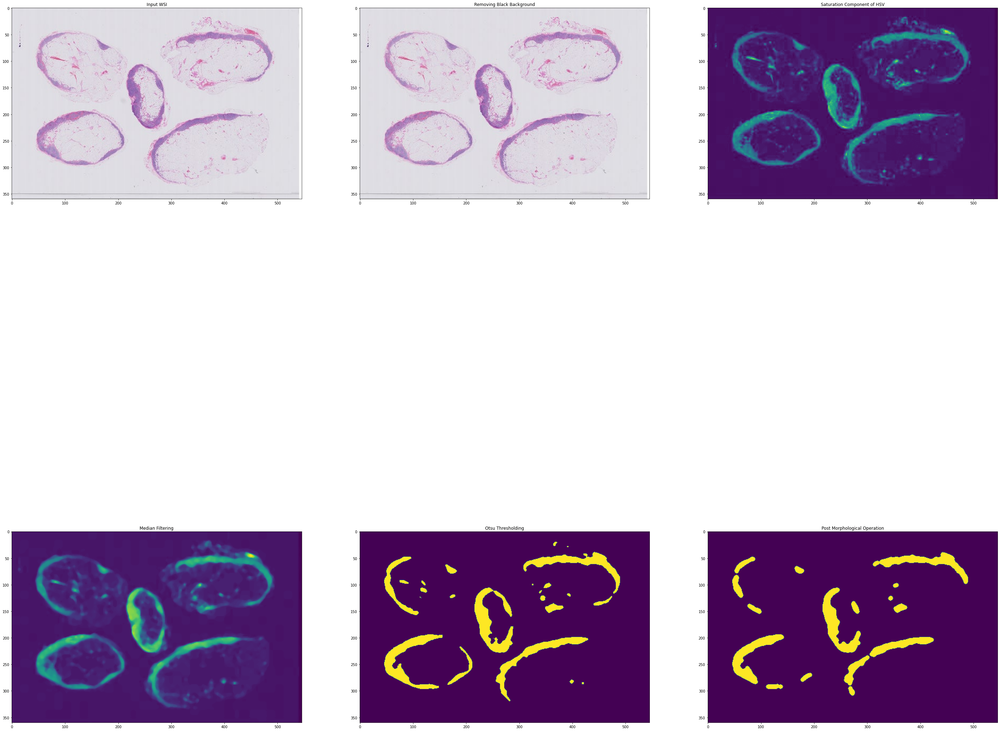

In [7]:
alpha = 0.9
display_segmentation_pipeline(sample_slide, LEVEL)

## WSI Tiling

In [8]:
PATCH_DIR_H5 = os.path.join(BASE_DIR, "patches/h5/")
PATCH_DIR_PNG = os.path.join(BASE_DIR, "patches/png/")
STITCH_DIR = os.path.join(BASE_DIR, "stitches/")
PATCH_LEVEL = 12
PATCH_SIZE = 256
PIXEL_OVERLAP = 128 #overlap in patch extraction
STORAGE_OPTION = 'hdf5' #choose either one of 'hdf5' or 'disk'

In [9]:
def read_labels(label_filepath):
    """ 
    Reads the slide-level labels from the Camelyon17's stage_labels.csv file and clean it.
    
    Args:
        
    Returns:
        labelDict : dictionary of {slide_name: tumor_label} for all the slides in training folder
    """
    
    myDict = {y[0]: y[1] for y in [x.split(",") for x in open(label_filepath).read().split('\n') if x]}
    labelDict = {}

    for key, val in myDict.items():
        if '.tif' in key:
            labelDict[key] = val

    newDict = labelDict
    for key in list(labelDict):
        newDict[key.split('.')[0]] = newDict.pop(key) #remove '.tif' from keys
    
    for key, value in newDict.items():
        if value == 'negative':
            newDict[key] = 0
        if value == 'itc':
            newDict[key] = 1
        if value == 'micro':
            newDict[key] = 2
        if value == 'macro':
            newDict[key] = 3
            
    return newDict


def save_to_hdf5(file_name, patches, coords, labels, count, db_location=PATCH_DIR_H5):
    """ 
    Saves the numpy arrays to HDF5 files. All patches from a single WSI will be saved 
    to the same HDF5 file, regardless of the transaction size specified by rows_per_txn, 
    because this is the most efficient way to use HDF5 datasets.
    
    Args:
        - slide        :    file path to the WSI to be saved into hdf5
        - db_location  :    folder to save h5 data in
        - patches      :    list of numpy images
        - coords       :    x, y tile coordinates
        - file_name    :    original source WSI name
        - labels       :    dictionary of {slide_name: tumor_label} for all the slides in training folder
    """
    print("Saving {} patches in HDF5 file for {}.".format(count, file_name))
    
    if not os.path.exists(db_location):
        os.makedirs(db_location)
        
    # Save patches into hdf5 file.
    slide = file_name
    with h5py.File(db_location + 'training_newPatch.h5','a') as hf:
        patient_index = "_".join(os.path.basename(slide).split('.')[0].split('_')[:2])
        slide_index = "_".join(os.path.basename(slide).split('.')[0].split('_')[3])
        slide_label = labels[os.path.basename(slide)]
        grp = hf.require_group(patient_index)
        subgrp = grp.require_group('wsi_{}'.format(slide_index))
        
        for i, patch in enumerate(patches):
            subsubgrp = subgrp.create_group('patch_{}'.format(i))
            subsubgrp.create_dataset('image', np.shape(np.array(patch)), data=patch,  compression="gzip", compression_opts=7)
            subsubgrp.create_dataset('label', np.shape(slide_label), data=slide_label)
            subsubgrp.attrs["patch_coords"] = (coords[i][0], coords[i][1])


def save_to_disk(patches, coords, file_name, labels, db_location=PATCH_DIR_PNG):
    """ 
    Saves numpy patches to .png files (full resolution). 
    Meta data is saved in the file name.
    
    Args:
        - db_location  :    folder to save images in
        - patches      :    numpy images
        - coords       :    x, y tile coordinates
        - file_name    :    original source WSI name
        - labels       :    patch labels (opt)
    """
    print("Saving patches to disk (png).")
    
    if not os.path.exists(db_location):
        os.makedirs(db_location)
        
    save_labels = len(labels)
    for i, patch in enumerate(patches):
        patch_fname = file_name + "_" + str(coords[i][0]) + "_" + str(coords[i][1]) + "_"

        if save_labels:
            patch_fname += str(labels[i])
            
        Image.fromarray(patch).save(db_location + patch_fname + ".png")

## Patch extraction - Custom

In [11]:
def isInHole(holes, point, patch_size):
    """
    Test weather a given point (patch_center) lies within a hole's contour.
    
    Args:
        - holes: A list of counters of holes within a parent tissue contour
        - point: (x,y) tuple of the point to investigate
        - patch_size: size of the patch under examination
        
    Returns:
        1 if point lies inside hole contours, 0 otherwise.
    
    """
    for hole in holes:
        if cv2.pointPolygonTest(hole, (point[0]+patch_size/2, point[1]+patch_size/2), False) > 0:
            return 1
    return 0


def isInContours(cont_check_fn, point, holes=None, patch_size=256):
    """
    Test weather given point(s) lie(s) within a Tissue's contour but outside its children-hole-contours.
    
    Args:
        - cont_check_fn: Flag for wither single-point check or multi-point check
        - holes: A list of counters of holes within a parent tissue contour
        - point: (x,y) tuple of the point to investigate
        - patch_size: size of the patch under examination
    
    Returns:
        1 if the point(s) are inside Tissue - Hole contours, 0 otherwise.
    """
    if cont_check_fn(point):
        if holes is not None:
            return not isInHole(holes, point, patch_size)
        else:
            return 1
    return 0


def isInContourSingle(contour, point, patch_size):
    """
    Test weather patch center is inside tissue contour.
    
    Args:
        - contour     : countour of tissue in WSI 
        - point       : top (x, y) coordinate of patch
        - patch_size  : size of the patch
    Return:
        1 if point is on/inside contour, 0 if its outside the contour
    """
    center = (point[0]+patch_size//2, point[1]+patch_size//2)
    return 1 if cv2.pointPolygonTest(contour, center, False) >= 0 else 0


def isInContourMulti(contour, point, patch_size, center_shift=0.5):
    """
    Test weather four points at some distance from the patch center are inside tissue contour.
    
    Args:
        - contour     : countour of tissue in WSI 
        - point       : top (x, y) coordinate of patch
        - patch_size  : size of the patch
        - center_shift : measure of what percentage of the distance between center and corner of patch do the four test-points lie
        
    Return:
        1 if point is on or inside contour, 0 if its outside the contour
    """
    shift = int(center_shift*patch_size//2)
    center = (point[0]+patch_size//2, point[1]+patch_size//2)
    
    if shift > 0:
        test_points = [(center[0]+shift, center[1]+shift),
                       (center[0]+shift, center[1]-shift),
                       (center[0]-shift, center[1]+shift),
                       (center[0]+shift, center[1]-shift)]
    else:
        test_points = [center]
    
    for points in test_points:
        if cv2.pointPolygonTest(contour, points, False) < 0:
            return 0
        
    return 1


def filter_contours(contours, hierarchy, area_threshold_tissue, area_threshold_hole, max_n_holes):
    """
    Filter contours by area.
    
    Args:
        - contours              :  all countours in WSI 
        - hierarchy             :  information regarding parent-child contours
        - area_threshold_tissue :  tissues with areas higher than this threshold are significant
        - area_threshold_hole   :  holes with area higher than this threshold are significant and considered (deducted from patching)
        - max_n_holes           :  maximum number of holes (above area_threshold_hole) to consider
        
    Returns:
        List of foreground_conturs and hole_contours.
    """
    filtered = []
    all_holes = []
    
    hierarchy_1 = np.flatnonzero(hierarchy[:,1] == -1) #find indices of foreground contours (i.e. parent == -1)

    #loop through tissue contours
    for cont_idx in hierarchy_1:
        cont = contours[cont_idx]
        holes = np.flatnonzero(hierarchy[:,1] == cont_idx) # indices of holes contained in this contour (children of parent contour)
        area = cv2.contourArea(cont)
        holes_area = [cv2.contourArea(contours[hole_idx]) for hole_idx in holes]
        area_tissue = area - np.array(holes_area).sum()
        if area_tissue == 0: continue
        if area_tissue > area_threshold_tissue:
            filtered.append(cont_idx)
            all_holes.append(holes)
    
    foreground_contours = [contours[cont_idx] for cont_idx in filtered]
    
    hole_contours = []
    
    for hole_ids in all_holes:
        unfiltered_holes = [contours[idx] for idx in hole_ids]
        unfiltered_holes = sorted(unfiltered_holes, key=cv2.contourArea, reverse=True)
        unfiltered_holes = unfiltered_holes[:max_n_holes] # take max_n_holes largest holes by area
        filtered_holes = []
        
        for hole in unfiltered_holes:
            if cv2.contourArea(hole) > area_threshold_hole:
                filtered_holes.append(hole)
        
        hole_contours.append(filtered_holes)
    return foreground_contours, hole_contours

In [12]:
def assertLevelDownsamples(slide):
    """
    Recalculate downsample factor for a slide's particular level in use.
    
    Args:
        slide:  an openslide object.
        
    Returns:
        List of Tuples of level_downsamples for every level of the WSI.
    """
    level_downsamples = []
    dim_0 = slide.level_dimensions[0]

    for downsample, dim in zip(slide.level_downsamples, slide.level_dimensions):
        estimated_downsample = (dim_0[0]/float(dim[0]), dim_0[1]/float(dim[1]))
        level_downsamples.append(estimated_downsample) if estimated_downsample != (downsample, downsample) else level_downsamples.append((downsample, downsample))
    return level_downsamples


def scaleContourDim(contours, scale):
    """
    Recalculate contour dimensions at a different resolution level.
    
    Args:
        - contours:  Tissue contours.
        - scale:  (Up/Down)scaling factor for the new resolution level
        
    Returns:
        Scaled tissue contours.
    """
    return [np.array(contour * scale, dtype='int32') for contour in contours]


def scaleHolesDim(contours, scale):
    """
    Recalculate (child) hole-contour dimensions for a given (Parent) Tissue contour at a different resolution level.
    
    Args:
        - contours:  (Parent) Tissue contours.
        - scale:  (Up/Down)scaling factor for the new resolution level
        
    Returns:
        Scaled hole contours.
    """
    return [[np.array(hole * scale, dtype = 'int32') for hole in holes] for holes in contours]


def extract_contours(slide_path, segmentation_level, area_threshold_tissue, area_threshold_hole, max_n_holes, median_threshold=7, close=0, ref_patch_size=512):
    """
    Segment the Tissue foreground from the background through a series of transformation and then extract Tissue and Hole contours from it:
    RGB --> Remove black background pixels--> HSV --> Median Blurring --> Thresholding --> Morphological Operations to fill holes 
    
    Args:
        - slide_path: Path to the slide to segment
        - segmentation_level: resolution level at which WSI is segmented/contours extracted
        - area_threshold_tissue: lower cutoff of tissue contour area
        - area_threshold_hole: lower cutoff of hole contour area
        - max_n_holes: maximum number of holes (above area_threshold_hole) to consider
        - median_threshold: morphological median filter parameter
        - close: morphological closing parameter
        - ref_patch_size: reference patch size
        
    Returns:
        List of filtered Tissue_contours and hole_contours
    
    """
    slide = open_slide(slide_path)
    img = np.array(slide.read_region((0, 0), segmentation_level, slide.level_dimensions[segmentation_level]))
    img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    img_med = cv2.medianBlur(img_hsv[:, :, 1], median_threshold)
    
    _, img_otsu = cv2.threshold(img_med, 0, 255, cv2.THRESH_OTSU + cv2.THRESH_BINARY)
    
    #morphological closing
    kernel = np.ones((close, close), np.uint8)
    img_otsu = cv2.morphologyEx(img_otsu, cv2.MORPH_CLOSE, kernel)
    
    slide_level_downsamples = assertLevelDownsamples(slide) #list of tuples
    scale_seg = slide_level_downsamples[segmentation_level]
    scaled_ref_patch_area = int(ref_patch_size**2 / (scale_seg[0] * scale_seg[1]))
    area_threshold_tissue = area_threshold_tissue * scaled_ref_patch_area
    area_threshold_hole = area_threshold_hole * scaled_ref_patch_area
    
    #extract contours
    contours, hierarchy = cv2.findContours(img_otsu, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_NONE)
    hierarchy = np.squeeze(hierarchy, axis=(0,))[:, 2:]
    
    tissue_contours, hole_contours = filter_contours(contours, hierarchy, area_threshold_tissue, area_threshold_hole, max_n_holes)
    
    tissue_contours = scaleContourDim(tissue_contours, scale_seg) #contour_tissue
    hole_contours = scaleHolesDim(hole_contours, scale_seg) #holes_tissue
    return tissue_contours, hole_contours


In [16]:
def isWhitePatch(patch, satThresh=5):
    """
    Test if a patch is mostly white background.
    
    Args:
        - patch:  the patch being examined
        - satThresh:  Threshold parameter
        
    Returns:
        (Bool) True if mean saturation value is below threshold, False otherwise.
    """
    patch_hsv = cv2.cvtColor(patch, cv2.COLOR_RGB2HSV)
    return True if np.mean(patch_hsv[:,:,1]) < satThresh else False


def isBlackPatch(patch, rgbThresh=40):
    """
    Test if a patch is mostly black background.
    
    Args:
        - patch:  the patch being examined
        - rgbThresh:  Threshold parameter
        
    Returns:
        (Bool) True if all pixels are below threshold, False otherwise.
    """
    return True if np.all(np.mean(patch, axis = (0,1)) < rgbThresh) else False


def extract_patches(slide_path, cont, cont_idx, hole_contours, patches, coords, count, patch_level, patch_size=256, step_size=128, white_black=True, 
                   white_thresh=15, black_thresh=50, contour_fn='single_pt', use_padding=True):
    """
    Extract patches and corresponding coordinates from a given contour of a WSI.
    
    Args:
    
    Returns:
        - Patches:
        - coords:
        - count: total #patches extracted from a particular contour
    """
    
    slide = open_slide(slide_path)
    start_x, start_y, w, h = cv2.boundingRect(cont) if cont is not None else (0, 0, 
                                                                              slide.level_dimensions[patch_level][0], 
                                                                              slide.level_dimensions[patch_level][1])
    print("[extract_patches] Bounding Box:", start_x, start_y, w, h)
    print("[extract_patches] Contour Area:", cv2.contourArea(cont))
    
    slide_level_downsamples = assertLevelDownsamples(slide) #list of tuples
    scale_patch = slide_level_downsamples[patch_level]
    patch_downsample = (int(scale_patch[0]), int(scale_patch[1]))
    ref_patch_size = (patch_size*patch_downsample[0], patch_size*patch_downsample[1])
    
    step_size_x = step_size * patch_downsample[0]
    step_size_y = step_size * patch_downsample[1]
    
    if isinstance(contour_fn, str):
        if contour_fn == 'four_pt':
            cont_check_fn = lambda point: isInContourMulti(contour=cont, point=point, patch_size=ref_patch_size[0], center_shift=0.5)
        elif contour_fn == 'single_pt':
            cont_check_fn = lambda point: isInContourSingle(contour=cont, point=point)
        else:
            raise NotImplementedError
    else:
        print("'contour_fn' variable not defined.")
    
    img_w, img_h = slide.level_dimensions[0]
    if use_padding:
        stop_y = start_y + h
        stop_x = start_x + w
    else:
        print("[extract_patches] Not using padding.")
        stop_y = min(start_y+h, img_h-ref_patch_size[1])
        stop_x = min(start_x+w, img_w-ref_patch_size[0])
        
    for y in range(start_y, stop_y, step_size_y):
        for x in range(start_x, stop_x, step_size_x):
            if not isInContours(cont_check_fn, (x,y), hole_contours[cont_idx] , ref_patch_size[0]):
                continue

            count += 1
            patch_PIL = slide.read_region((x,y), patch_level, (patch_size, patch_size)).convert('RGB')

            if white_black:
                if isBlackPatch(np.array(patch_PIL), rgbThresh=black_thresh) or isWhitePatch(np.array(patch_PIL), satThresh=white_thresh):
                    continue
            
            if count%20 == 0:
                patch_PIL.save('./patches/patch_{}_{}'.format(x, y) + '.png') #save 20% of patches
            
            patches.append(patch_PIL)
            coords.append(np.array([x//patch_downsample[0], y//patch_downsample[1]]))

    print("[extract_patches] #patches for this contour: ", count)
    return patches, coords, count

In [14]:
def sample_and_store_patches(slide_path, label_filepath, segmentation_level=4, area_threshold_tissue=100, area_threshold_hole=16, max_n_holes=8,
                             median_threshold=7, close=4, ref_patch_size=256, patch_level=1, step_size=128, white_black=True,  white_thresh=15, black_thresh=50,
                             contour_fn='four_pt', use_padding=True, storage_option='hdf5'):
    """ 
    Sample patches of specified size from WSI file.
    
    Args:
        - slides          :    list of all available WSI file paths
        - file_name       :    name of whole slide image to sample from
        - file_dir        :    directory file is located in
        - pixel_overlap   :    pixels overlap on each side
        - level           :    0 is lowest resolution; level_count - 1 is highest
        - rows_per_txn    :    how many patches to load into memory at once
        - storage_option  :    the patch storage option              
        
    Note: patch_size is the dimension of the sampled patches, NOT equivalent to 
    openslide's definition of tile_size.
    
    Return:
        Count(int): #patches extracted from the WSI
    """

    labels = read_labels(label_filepath)
    
    for file in slide_path:
        tissue_contours, hole_contours = extract_contours(file, segmentation_level, area_threshold_tissue, area_threshold_hole, 
                                                          max_n_holes, median_threshold, close, ref_patch_size)
        
        patches, coords = [], []
        count = 0
        for idx, cont in enumerate(tissue_contours):
            patches, coords, count = extract_patches(file, cont, idx, hole_contours, patches, coords, count, patch_level, ref_patch_size, step_size, white_black, 
                                           white_thresh, black_thresh, contour_fn, use_padding)

        if storage_option == 'disk':
            file_name = os.path.basename(slide_path).rsplit('.')[0]
            save_to_disk(patches, coords, file_name, labels)
        elif storage_option != 'hdf5':
            del patches
            del coords
            patches, coords = [], [] # Reset right away.
        elif storage_option == 'hdf5':
            file_name = os.path.basename(file).split('.')[0]
            save_to_hdf5(file_name, patches, coords, labels, count)

In [17]:
label_filepath = "/home/avnish/histopathology/datasets/Camelyon17/training/stage_labels.csv"
sample_slide = ["/home/avnish/histopathology/datasets/Camelyon17/training/center_4/patient_080_node_4.tif"]

sample_and_store_patches(sample_slide, label_filepath)

[extract_patches] Bounding Box: 65312 50720 51201 33905
[extract_patches] Contour Area: 189615488.0
[extract_patches] #patches for this contour:  2374
[extract_patches] Bounding Box: 11648 49552 42625 26449
[extract_patches] Contour Area: 824499968.0
[extract_patches] #patches for this contour:  6080
[extract_patches] Bounding Box: 88864 34016 10273 5697
[extract_patches] Contour Area: 23425664.0
[extract_patches] #patches for this contour:  6312
[extract_patches] Bounding Box: 54816 26944 18881 31777
[extract_patches] Contour Area: 431446400.0
[extract_patches] #patches for this contour:  9523
[extract_patches] Bounding Box: 85840 24672 8529 5729
[extract_patches] Contour Area: 9969408.0
[extract_patches] #patches for this contour:  9626
[extract_patches] Bounding Box: 40128 14448 7601 6129
[extract_patches] Contour Area: 15282688.0
[extract_patches] #patches for this contour:  9817
[extract_patches] Bounding Box: 11472 11696 18657 28913
[extract_patches] Contour Area: 97972480.0
[ext

In [18]:
from h5glance import H5Glance

read_h5_newPatch = h5py.File('/home/avnish/histopathology/datasets/Camelyon17/patches/h5/training_newPatch.h5', 'r+')
H5Glance(read_h5_newPatch)

In [16]:
read_h5_newPatch.close()

## Visualize

In [22]:
def segmentation(slide_path, segmentation_level, area_threshold_tissue, area_threshold_hole, max_n_holes, median_threshold=7, close=0, ref_patch_size=512):
    """
    Segment the Tissue foreground from the background through a series of transformation and then extract Tissue and Hole contours from it:
    RGB --> Remove black background pixels--> HSV --> Median Blurring --> Thresholding --> Morphological Operations to fill holes 
    
    Args:
        slide_path: Path to the slide to segment.

    Returns:
    
    """
    slide = open_slide(slide_path)
    img = np.array(slide.read_region((0, 0), segmentation_level, slide.level_dimensions[segmentation_level]))
    img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    img_med = cv2.medianBlur(img_hsv[:, :, 1], median_threshold)
    
    _, img_otsu = cv2.threshold(img_med, 0, 255, cv2.THRESH_OTSU + cv2.THRESH_BINARY)
    
    #morphological closing
    kernel = np.ones((close, close), np.uint8)
    img_otsu = cv2.morphologyEx(img_otsu, cv2.MORPH_CLOSE, kernel)
    
    slide_level_downsamples = assertLevelDownsamples(slide) #list of tuples
    scale_seg = slide_level_downsamples[segmentation_level]
    scaled_ref_patch_area = int(ref_patch_size**2 / (scale_seg[0] * scale_seg[1]))
    area_threshold_tissue = area_threshold_tissue * scaled_ref_patch_area
    area_threshold_hole = area_threshold_hole * scaled_ref_patch_area
    
    #extract contours
    contours, hierarchy = cv2.findContours(img_otsu, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_NONE)
    hierarchy = np.squeeze(hierarchy, axis=(0,))[:, 2:]
    
    tissue_contours, hole_contours = filter_contours(contours, hierarchy, area_threshold_tissue, area_threshold_hole, max_n_holes)
    
#     tissue_contours = scaleContourDim(tissue_contours, scale_seg) #contour_tissue
#     hole_contours = scaleHolesDim(hole_contours, scale_seg) #holes_tissue
    return tissue_contours, hole_contours, contours, hierarchy, img, img_hsv, img_med, img_otsu

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


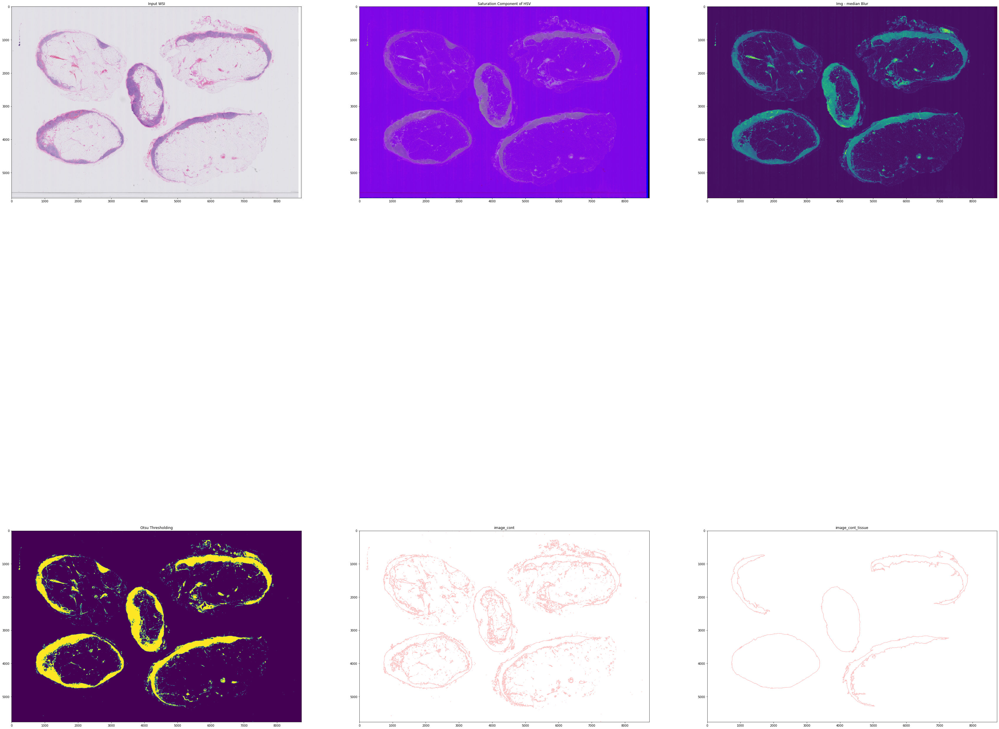

In [23]:
# contours
sample_slide1 = "/home/avnish/histopathology/datasets/Camelyon17/training/center_4/patient_080_node_4.tif"
tissue_contours, hole_contours, contours, hierarchy, img, img_hsv, img_med, img_otsu = segmentation(sample_slide1, segmentation_level=4, area_threshold_tissue=100,
                                                                                                    area_threshold_hole=16, max_n_holes=8, median_threshold=7,
                                                                                                    close=0, ref_patch_size=512)

img_contours = np.ones(img.shape)
image_cont = cv2.drawContours(img_contours.copy(), contours, -1, (255,0,0), 3)
image_cont_tissue = cv2.drawContours(img_contours, tissue_contours, -1, (255,0,0), 3)
# image_cont_hole = cv2.drawContours(img_contours.copy(), hole_contours, -1, (255,0,0), 3)

fig, axs = plt.subplots(2, 3, figsize=(60, 60),)
axs[0, 0].imshow(img)
axs[0, 0].set_title('Input WSI')   
axs[0, 1].imshow(img_hsv)
axs[0, 1].set_title('Saturation Component of HSV') 
axs[0, 2].imshow(img_med)
axs[0, 2].set_title('Img - median Blur')
axs[1, 0].imshow(img_otsu)
axs[1, 0].set_title('Otsu Thresholding')
axs[1, 1].imshow(image_cont)
axs[1, 1].set_title('image_cont') 
axs[1, 2].imshow(image_cont_tissue)
axs[1, 2].set_title('image_cont_tissue')
plt.show()

## Recreate WSI from Patches

In [ ]:
def DrawGrid(img, coord, shape, thickness=2, color=(0,0,0,255)):
    cv2.rectangle(img, tuple(np.maximum([0, 0], coord-thickness//2)), tuple(coord - thickness//2 + np.array(shape)), (0, 0, 0, 255), thickness=thickness)
    return img


def DrawMap(canvas, patch_data, coords, patch_size, draw_grid=True):
    indices = np.arange(len(coords))
    total = len(indices)
    
    for idx in range(total):
        if idx % math.ceil(total * 0.1)
        print("Done stitching {}/{} patches.".format(idx, total))
        
        patch_id = indices[idx]
        patch = patch_data[patch_id]
        patch = cv2.resize(patch, patch_size)
        coord = coords[patch_id]
        canvas_crop_shape = canvas[coord[1]:coord[1]+patch_size[1], coord[0]:coord[0]+patch_size[0], :3].shape[:2]
        canvas[coord[1]:coord[1]+patch_size[1], coord[0]:coord[0]+patch_size[0], :3] = patch[:canvas_crop_shape[0], :canvas_crop_shape[1], :]
        if draw_grid:
            DrawGrid(canvas, coord, patch_size)
    return Image.fromarray(canvas)

In [ ]:
hdf5_filepath = '/home/avnish/histopathology/datasets/Camelyon17/patches/h5/training_newPatch.h5'
downscale = 16
bg_color = (0,0,0)

slide = open_slide(sample_slide1)
file = h5py.File(hdf5_filepath, 'r')
patch_data = file['patient_080/wsi_4/image']
coords = file['patient_080/wsi_4/coords'] #attr?
w, h = slide.level_dimensions[patch_level] #downsampled level_dimensions
print("Original patching size: {} x {}".format(w, h))
w = w //downscale
h = h//downscale
coords = (coords/downscale).astype(np.int32)
print('downscaled size for stiching: {} x {}'.format(w, h))
# print('number of patches: {}'.format(len(patch_data))) ##
# print('patch shape: {}'.format(patch_data[0].shape)) ##
downscale_patch_shape = (patch_data[0].shape[0]//downscale, patch_data[0].shape[1]//downscale)

if w*h > Image.MAX_IMAGE_PIXELS:
    raise Image.DecompressionBombError("Image is too large. Increase downscale value further! Current value: {}".format(downscale))

if alpha < 0 or alpha == -1:
    heatmap = Image.new(size=(w,h), mode="RGB", color=bg_color)
else:
    heatmap = Image.new(size=(w,h), mode="RGBA", color=bg_color + (int(255 * alpha),))

heatmap = np.array(heatmap)
heatmap = DrawMap(heatmap, dset, coords, downscaled_shape, indices=None, draw_grid=draw_grid)

file.close()
plt.imshow(heatmap)


In [39]:
file.close()

In [36]:
hf = h5py.File('../datasets/Camelyon17/patches/h5/training_newPatch.h5', 'r')
print("groups: ", hf.keys())
data1 = hf.get('patient_080/wsi_4')
data1.items()

groups:  <KeysViewHDF5 ['patient_080']>


ItemsViewHDF5(<HDF5 group "/patient_080/wsi_4" (13560 members)>)